##  Supervised Machine  learning  Mini Project(classification): Dry Bean Type Classification

## Yogesh singh, Batch 13

## Objective

An agriculture company approaches you with a challenge: they are currently classifying different types of dry beans manually,

 a process that is labour-intensive, prone to errors and inefficient at scale. They want to automate this classification process using Artificial Intelligence to improve accuracy, reduce operational costs and ensure consistent quality in packaging and distribution.

As a data scientist, your role is to help them build a machine learning solution that can accurately classify bean types based on physical characteristics such as area, perimeter, shape and compactness. By doing this, you'll:

•	Automate the bean classification process using supervised learning techniques

•	Help the company reduce manual labour and cost

•	Improve the speed and reliability of quality control operations

•	Deliver a scalable solution for real-time classification in industrial settings

This project not only enhances your understanding of supervised machine learning but also demonstrates how AI can be directly applied to Agri-tech and food processing industries for tangible business impact.


In [50]:
import pandas as pd

df = pd.read_excel('dry Beans Multiclass Classification (1).xlsx')

In [5]:
df

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13606,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13607,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13608,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13609,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


### finding total    V13611 rows × 17 columns indata

In [6]:
import pandas as pd
df = pd.read_excel('/content/dry Beans Multiclass Classification (1).xlsx')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Area             13611 non-null  int64  
 1   Perimeter        13611 non-null  float64
 2   MajorAxisLength  13611 non-null  float64
 3   MinorAxisLength  13611 non-null  float64
 4   AspectRation     13611 non-null  float64
 5   Eccentricity     13611 non-null  float64
 6   ConvexArea       13611 non-null  int64  
 7   EquivDiameter    13611 non-null  float64
 8   Extent           13611 non-null  float64
 9   Solidity         13611 non-null  float64
 10  roundness        13611 non-null  float64
 11  Compactness      13611 non-null  float64
 12  ShapeFactor1     13611 non-null  float64
 13  ShapeFactor2     13611 non-null  float64
 14  ShapeFactor3     13611 non-null  float64
 15  ShapeFactor4     13611 non-null  float64
 16  Class            13611 non-null  object 
dtypes: float64(1

In [7]:
df.isnull().sum()

,0
Area,0
Perimeter,0
MajorAxisLength,0
MinorAxisLength,0
AspectRation,0
Eccentricity,0
ConvexArea,0
EquivDiameter,0
Extent,0
Solidity,0


Not find any missing value,

## 2. Exploratory Data Analysis (EDA)
•	Visualize distributions of features using histograms and boxplots

•	Analyze the class distribution (check for class imbalance)

•	Plot feature correlations (eg heatmap)

•	Visualize multivariate relationships (pairplot)
•	Summarize key findings


### Histograms of Numerical Features

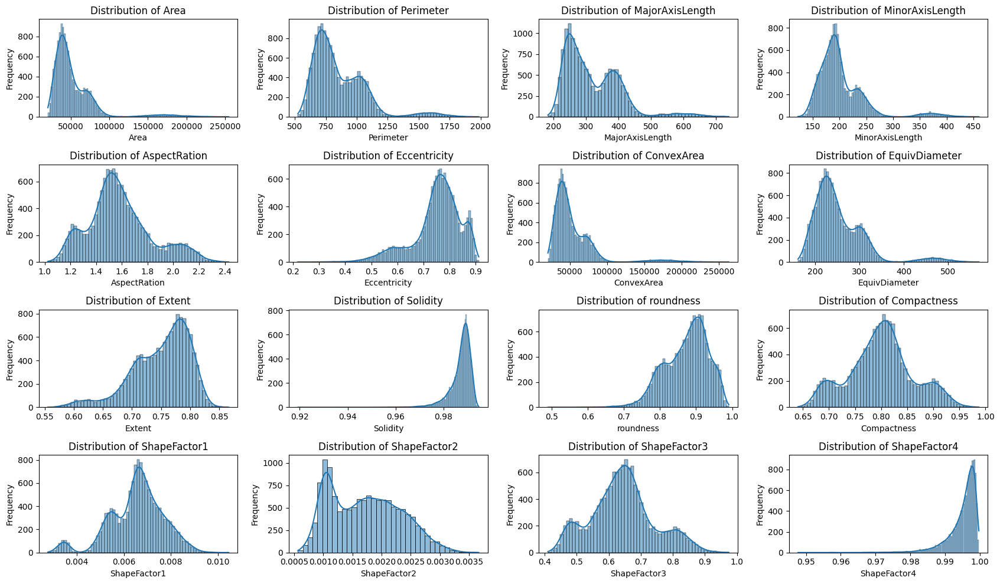

In [8]:
import matplotlib.pyplot as plt
import seaborn as sns

# Select only numerical columns for plotting
numerical_cols = df.select_dtypes(include=['number']).columns

# Plot histograms for numerical features
plt.figure(figsize=(17, 10))
for i, col in enumerate(numerical_cols):
    plt.subplot(4, 4, i + 1) # Adjust subplot grid as needed
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

data hs skewed and findin outlier variable

### Boxplots of Numerical Features

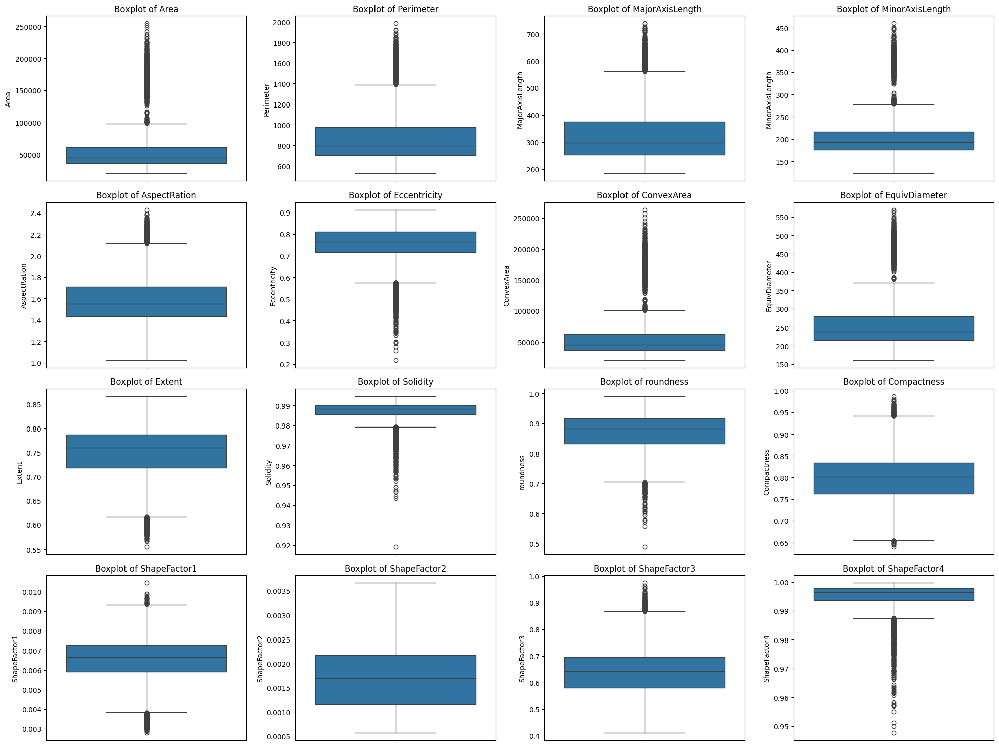

In [9]:
# Plot boxplots for numerical features
plt.figure(figsize=(20, 15))
for i, col in enumerate(numerical_cols):
    plt.subplot(4, 4, i + 1) # Adjust subplot grid as needed
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of {col}')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

### Class Distribution Analysis

Class Distribution:
 Class
DERMASON    3546
SIRA        2636
SEKER       2027
HOROZ       1928
CALI        1630
BARBUNYA    1322
BOMBAY       522
Name: count, dtype: int64


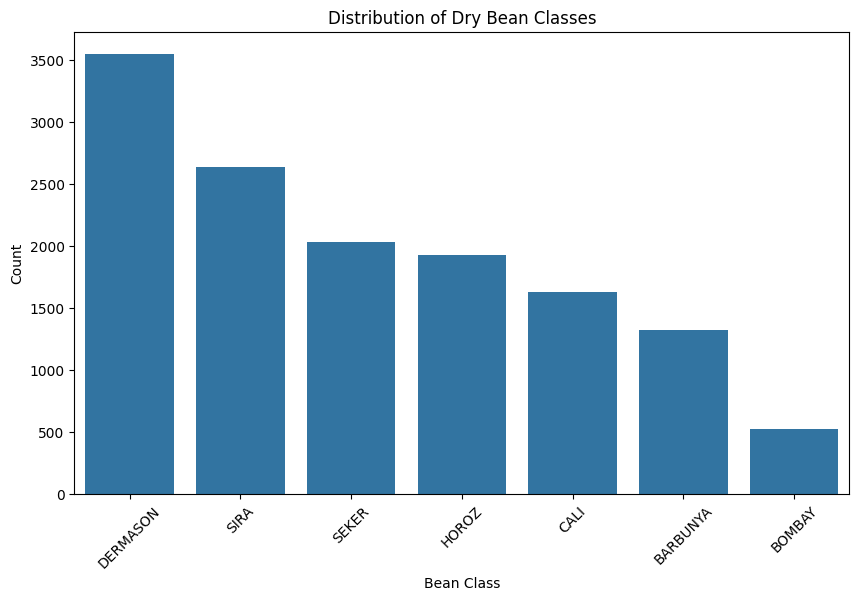

In [10]:
# Analyze the distribution of the target variable 'Class'
class_distribution = df['Class'].value_counts()
print("Class Distribution:\n", class_distribution)

# Visualize the class distribution
plt.figure(figsize=(10, 6))
sns.barplot(x=class_distribution.index, y=class_distribution.values)
plt.title('Distribution of Dry Bean Classes')
plt.xlabel('Bean Class')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

### Feature Correlation Analysis

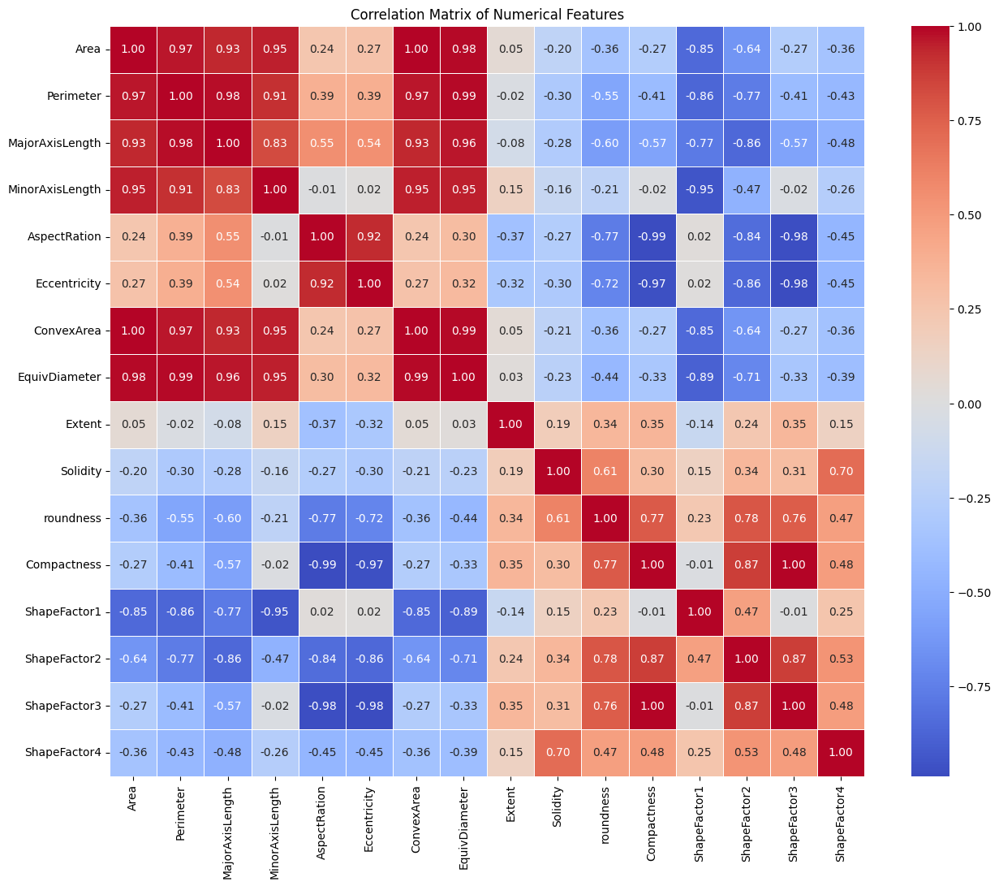

In [11]:
# Calculate the correlation matrix for numerical features
correlation_matrix = df[numerical_cols].corr()

# Plot the correlation heatmap
plt.figure(figsize=(15, 12))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=.5)
plt.title('Correlation Matrix of Numerical Features')
plt.show()

### Multivariate Relationships (Pairplot)

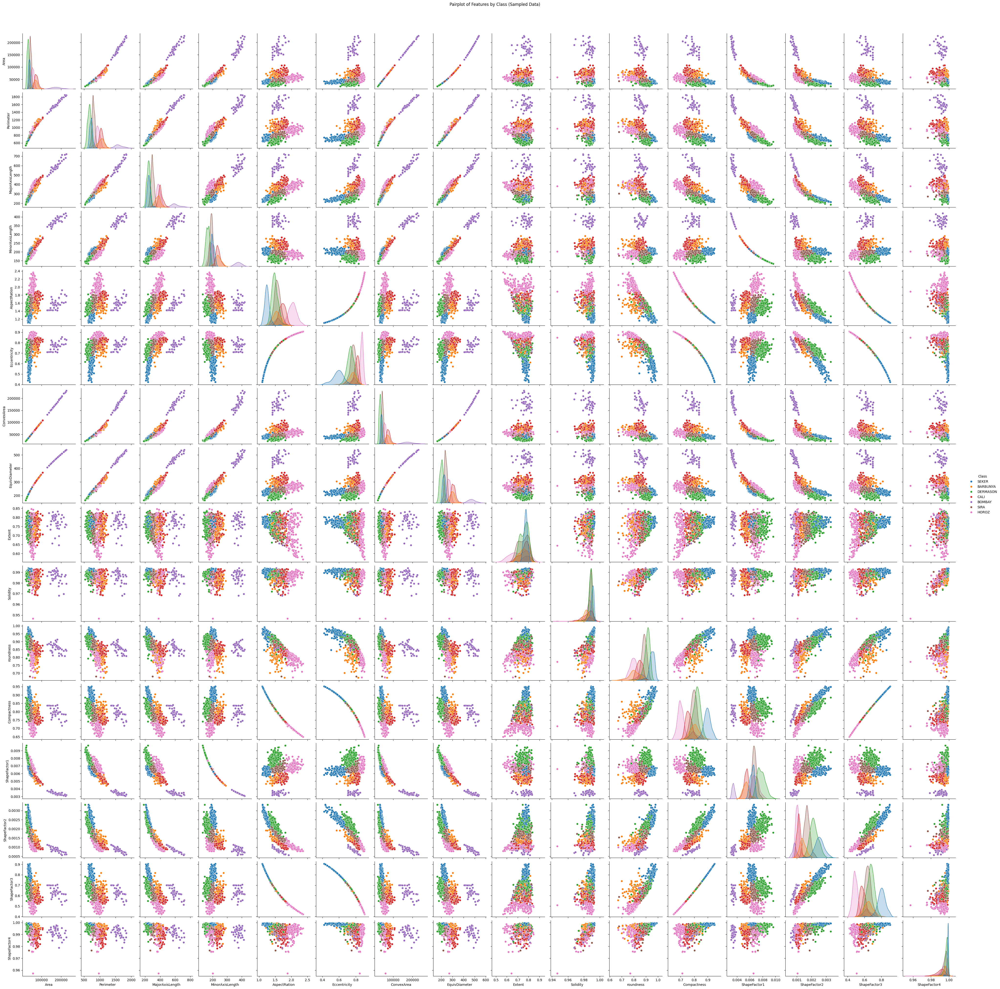

In [12]:
# Visualize multivariate relationships using a pairplot (sampling if dataset is too large)
# Due to the dataset size, we'll sample a subset for the pairplot to ensure readability and performance.
sample_df = df.sample(n=1000, random_state=42) # Adjust sample size as needed

sns.pairplot(sample_df, hue='Class', diag_kind='kde')
plt.suptitle('Pairplot of Features by Class (Sampled Data)', y=1.02)
plt.show()

## 3. Missing Values & Outlier Treatment
•	Check for and handle missing values

•	Detect and treat outliers if needed (Z-score / IQR methods/boxplots)


In [15]:
from scipy.stats import yeojohnson
import numpy as np

# Re-select numerical columns, excluding the target if it were numerical
numerical_features = df.select_dtypes(include=np.number).columns.tolist()

# Initialize a dictionary to store transformation parameters
transformation_params = {}

# Apply Yeo-Johnson transformation to each numerical feature
for feature in numerical_features:
    # Check for skewness before transformation if needed, or apply universally
    # For simplicity, applying to all numerical features as requested
    transformed_data, lambda_param = yeojohnson(df[feature])
    df[feature] = transformed_data
    transformation_params[feature] = lambda_param
    print(f"Applied Yeo-Johnson transformation to '{feature}' with lambda = {lambda_param:.4f}")

print("\nDataFrame after Yeo-Johnson transformation:")
print(df.head())

Applied Yeo-Johnson transformation to 'Area' with lambda = -0.8120
Applied Yeo-Johnson transformation to 'Perimeter' with lambda = -1.4052
Applied Yeo-Johnson transformation to 'MajorAxisLength' with lambda = -1.1170
Applied Yeo-Johnson transformation to 'MinorAxisLength' with lambda = -1.8607
Applied Yeo-Johnson transformation to 'AspectRation' with lambda = -1.2971
Applied Yeo-Johnson transformation to 'Eccentricity' with lambda = 7.6356
Applied Yeo-Johnson transformation to 'ConvexArea' with lambda = -0.8132
Applied Yeo-Johnson transformation to 'EquivDiameter' with lambda = -1.6337
Applied Yeo-Johnson transformation to 'Extent' with lambda = 13.3295
Applied Yeo-Johnson transformation to 'Solidity' with lambda = 110.8327
Applied Yeo-Johnson transformation to 'roundness' with lambda = 8.5001
Applied Yeo-Johnson transformation to 'Compactness' with lambda = 0.5759
Applied Yeo-Johnson transformation to 'ShapeFactor1' with lambda = 140.7474
Applied Yeo-Johnson transformation to 'ShapeFa

### Histograms of Numerical Features After Yeo-Johnson Transformation

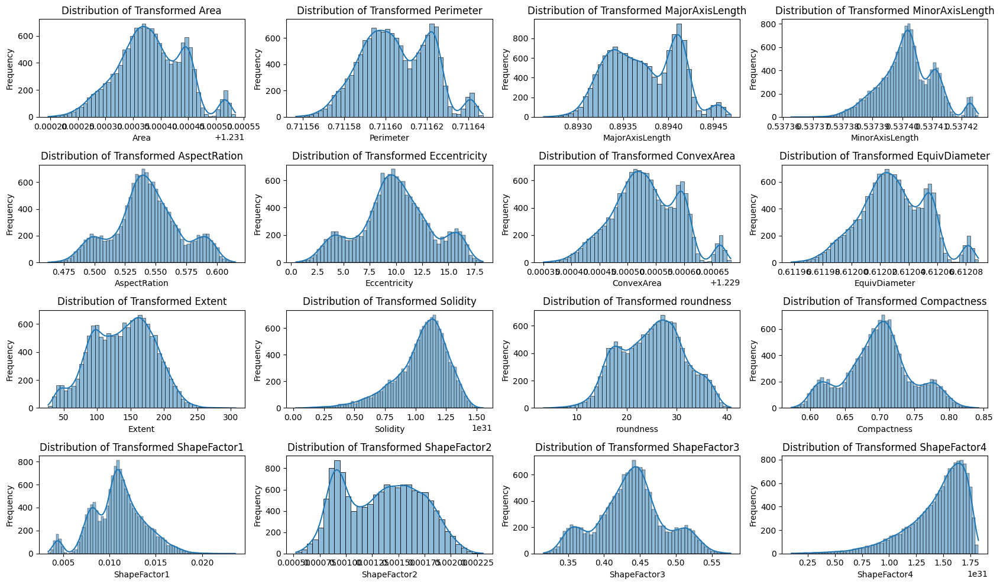

In [16]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Re-select numerical columns after transformation
numerical_cols_transformed = df.select_dtypes(include=np.number).columns

# Plot histograms for transformed numerical features
plt.figure(figsize=(17, 10))
for i, col in enumerate(numerical_cols_transformed):
    plt.subplot(4, 4, i + 1) # Adjust subplot grid as needed
    sns.histplot(df[col], kde=True)
    plt.title(f'Distribution of Transformed {col}')
    plt.xlabel(col)
    plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

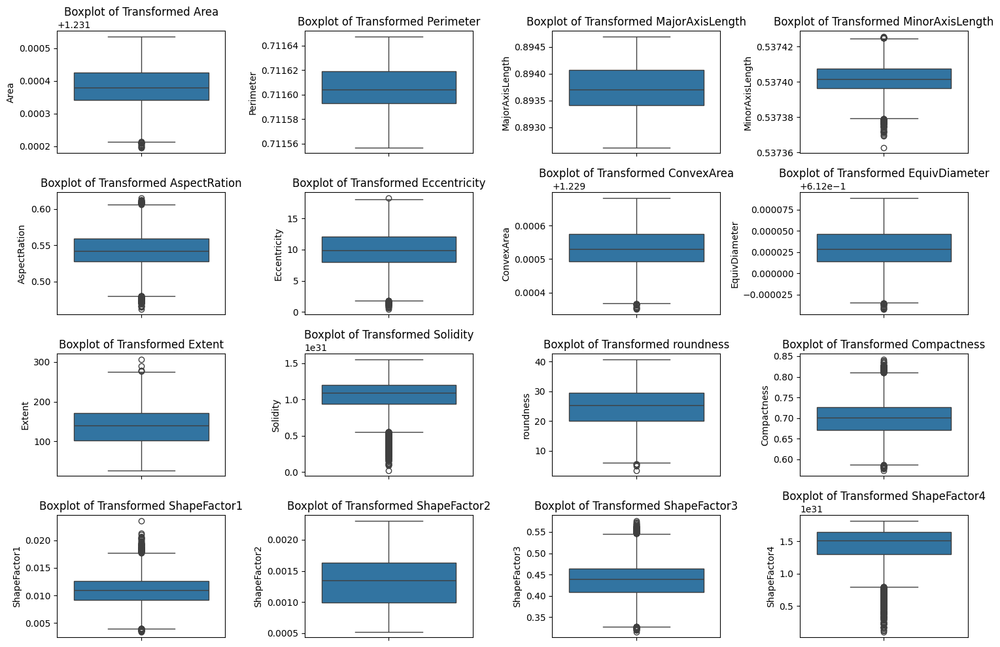

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Re-select numerical columns after transformation
numerical_cols_transformed = df.select_dtypes(include=np.number).columns

# Plot boxplots for transformed numerical features to check for outliers
plt.figure(figsize=(15, 10)) # Adjust figure size as needed
for i, col in enumerate(numerical_cols_transformed):
    plt.subplot(4, 4, i + 1) # Adjust subplot grid based on number of features
    sns.boxplot(y=df[col])
    plt.title(f'Boxplot of Transformed {col}')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

### Outlier Treatment using IQR Method

After applying the Yeo-Johnson transformation and visualizing the distributions, we will now address outliers. The Interquartile Range (IQR) method will be used to identify and remove data points that fall outside 1.5 times the IQR from the first and third quartiles.

In [18]:
import numpy as np

# Assuming df is already transformed from previous steps
# Re-select numerical columns after transformation
numerical_cols_transformed = df.select_dtypes(include=np.number).columns.tolist()

df_cleaned = df.copy() # Create a copy to perform outlier removal

original_shape = df_cleaned.shape

# Outlier treatment using IQR method
for col in numerical_cols_transformed:
    Q1 = df_cleaned[col].quantile(0.25)
    Q3 = df_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Filter out outliers for the current column
    df_cleaned = df_cleaned[(df_cleaned[col] >= lower_bound) & (df_cleaned[col] <= upper_bound)]

print(f"Shape of DataFrame before outlier removal: {original_shape}")
print(f"Shape of DataFrame after outlier removal using IQR: {df_cleaned.shape}")

# Display the head of the cleaned DataFrame
display(df_cleaned.head())

Shape of DataFrame before outlier removal: (13611, 17)
Shape of DataFrame after outlier removal using IQR: (12524, 17)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,1.231287,0.711577,0.892962,0.537396,0.493246,3.584799,1.229440,0.611993,144.683109,1.122945e+31,35.451563,0.786718,0.012759,0.002104,0.522981,1.723549e+31,SEKER
2,1.231296,0.711580,0.893018,0.537396,0.495285,3.827873,1.229447,0.611996,161.000150,1.167788e+31,33.910300,0.783235,0.012518,0.002062,0.519611,1.756515e+31,SEKER
3,1.231301,0.711584,0.892991,0.537399,0.485939,2.744148,1.229455,0.611998,166.604215,5.690549e+30,27.914682,0.798069,0.011904,0.002132,0.533944,1.341217e+31,SEKER
5,1.231303,0.711582,0.893015,0.537398,0.488904,3.079089,1.229454,0.611999,158.096755,1.164607e+31,33.321219,0.794583,0.011913,0.002106,0.530580,1.773087e+31,SEKER
6,1.231304,0.711588,0.892997,0.537399,0.484756,2.612962,1.229457,0.612000,143.028080,8.603292e+30,22.151933,0.801885,0.011662,0.002143,0.537623,1.754824e+31,SEKER


### Boxplots of Numerical Features After Outlier Treatment

Now, let's visualize the distributions again using boxplots on the `df_cleaned` DataFrame to see the effect of the outlier removal.

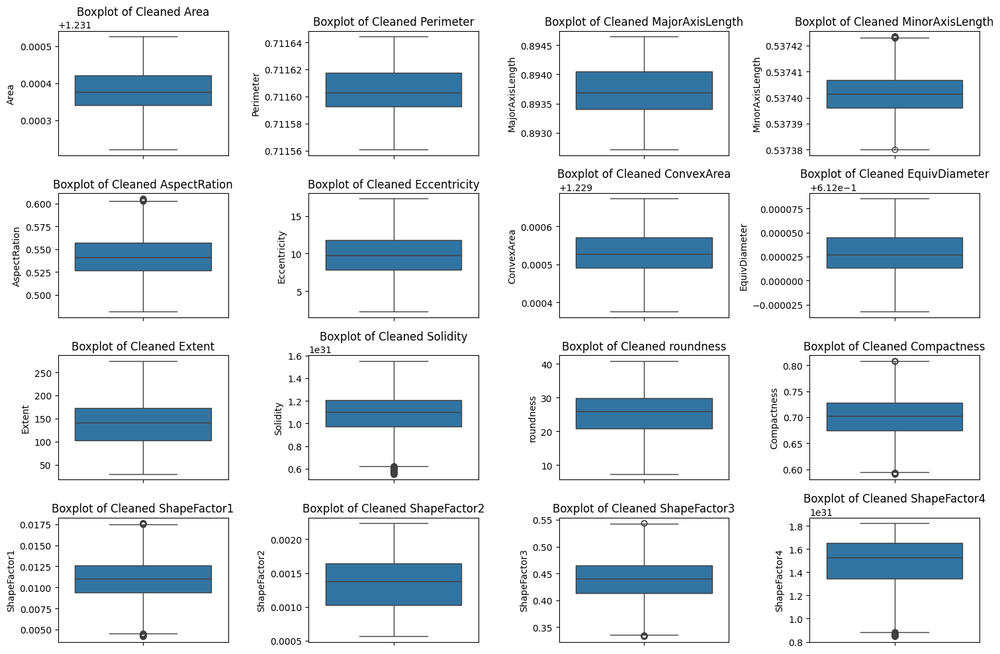

In [19]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Re-select numerical columns from the cleaned DataFrame
numerical_cols_cleaned = df_cleaned.select_dtypes(include=np.number).columns

# Plot boxplots for cleaned numerical features to check for remaining outliers
plt.figure(figsize=(15, 10)) # Adjust figure size as needed
for i, col in enumerate(numerical_cols_cleaned):
    plt.subplot(4, 4, i + 1) # Adjust subplot grid based on number of features
    sns.boxplot(y=df_cleaned[col])
    plt.title(f'Boxplot of Cleaned {col}')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

### Removing 'Solidity' and 'ShapeFactor4' Columns

Based on previous analysis (e.g., potential high correlation or extreme values), we will remove the 'Solidity' and 'ShapeFactor4' columns from the cleaned DataFrame (`df_cleaned`).

In [20]:
# Columns to remove
columns_to_remove = ['Solidity', 'ShapeFactor4']

# Drop the columns from df_cleaned
df_cleaned = df_cleaned.drop(columns=columns_to_remove)

print(f"DataFrame shape after removing {columns_to_remove}: {df_cleaned.shape}")
display(df_cleaned.head())

DataFrame shape after removing ['Solidity', 'ShapeFactor4']: (12524, 15)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,Class
0,1.231287,0.711577,0.892962,0.537396,0.493246,3.584799,1.229440,0.611993,144.683109,35.451563,0.786718,0.012759,0.002104,0.522981,SEKER
2,1.231296,0.711580,0.893018,0.537396,0.495285,3.827873,1.229447,0.611996,161.000150,33.910300,0.783235,0.012518,0.002062,0.519611,SEKER
3,1.231301,0.711584,0.892991,0.537399,0.485939,2.744148,1.229455,0.611998,166.604215,27.914682,0.798069,0.011904,0.002132,0.533944,SEKER
5,1.231303,0.711582,0.893015,0.537398,0.488904,3.079089,1.229454,0.611999,158.096755,33.321219,0.794583,0.011913,0.002106,0.530580,SEKER
6,1.231304,0.711588,0.892997,0.537399,0.484756,2.612962,1.229457,0.612000,143.028080,22.151933,0.801885,0.011662,0.002143,0.537623,SEKER


### Boxplots of Numerical Features After Outlier Treatment and Column Removal

Let's re-visualize the distributions using boxplots on the `df_cleaned` DataFrame. This will reflect both the IQR outlier treatment and the removal of the 'Solidity' and 'ShapeFactor4' columns.

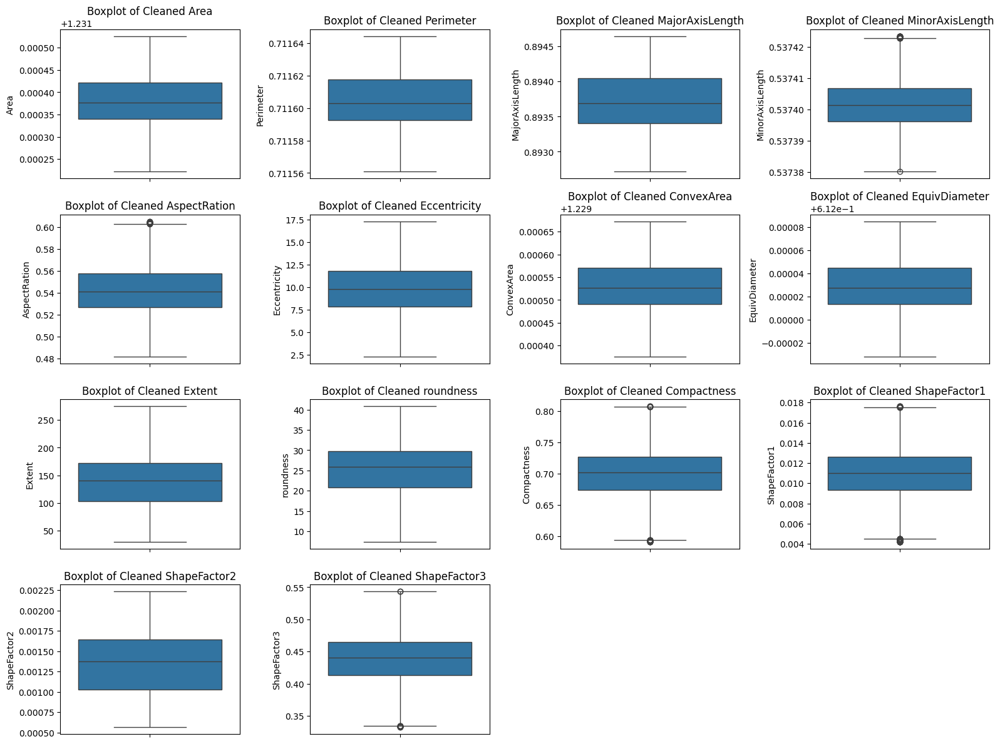

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Re-select numerical columns from the cleaned DataFrame
numerical_cols_final = df_cleaned.select_dtypes(include=np.number).columns

# Calculate the number of rows and columns for the subplot grid
num_features = len(numerical_cols_final)
num_cols = 4  # You can adjust this for better layout
num_rows = (num_features + num_cols - 1) // num_cols # Ensures enough rows

plt.figure(figsize=(num_cols * 4, num_rows * 3)) # Adjust figure size dynamically

for i, col in enumerate(numerical_cols_final):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.boxplot(y=df_cleaned[col])
    plt.title(f'Boxplot of Cleaned {col}')
    plt.ylabel(col)
plt.tight_layout()
plt.show()

In [23]:
import pandas as pd
import numpy as np
from scipy.stats import yeojohnson

# 1. Load the original dataset
df_raw = pd.read_excel('/content/dry Beans Multiclass Classification (1).xlsx')

# 2. Re-apply Preprocessing (Yeo-Johnson & Cleaning)
numerical_features = df_raw.select_dtypes(include=np.number).columns.tolist()
for feature in numerical_features:
    df_raw[feature], _ = yeojohnson(df_raw[feature])

# IQR Outlier Removal
df_cleaned = df_raw.copy()
for col in numerical_features:
    Q1, Q3 = df_cleaned[col].quantile(0.25), df_cleaned[col].quantile(0.75)
    IQR = Q3 - Q1
    df_cleaned = df_cleaned[(df_cleaned[col] >= Q1 - 1.5 * IQR) & (df_cleaned[col] <= Q3 + 1.5 * IQR)]

# Drop problematic columns identified earlier
df_cleaned = df_cleaned.drop(columns=['Solidity', 'ShapeFactor4'])

# 3. Separate features (X) and target variable (y)
X = df_cleaned.drop('Class', axis=1)
y = df_cleaned['Class']

print(f"Data successfully processed.")
print(f"Features (X) shape: {X.shape}")
print(f"Target (y) shape: {y.shape}")
display(X.head())

Data successfully processed.
Features (X) shape: (12524, 14)
Target (y) shape: (12524,)


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3
0,1.231287,0.711577,0.892962,0.537396,0.493246,3.584799,1.229440,0.611993,144.683109,35.451563,0.786718,0.012759,0.002104,0.522981
2,1.231296,0.711580,0.893018,0.537396,0.495285,3.827873,1.229447,0.611996,161.000150,33.910300,0.783235,0.012518,0.002062,0.519611
3,1.231301,0.711584,0.892991,0.537399,0.485939,2.744148,1.229455,0.611998,166.604215,27.914682,0.798069,0.011904,0.002132,0.533944
5,1.231303,0.711582,0.893015,0.537398,0.488904,3.079089,1.229454,0.611999,158.096755,33.321219,0.794583,0.011913,0.002106,0.530580
6,1.231304,0.711588,0.892997,0.537399,0.484756,2.612962,1.229457,0.612000,143.028080,22.151933,0.801885,0.011662,0.002143,0.537623


## 4. Feature Engineering & Preprocessing

•	Scale numerical features (robust, scaler ,StandardScaler / MinMaxScaler)

•	Encode categorical variables if necessary


In [24]:
from sklearn.preprocessing import RobustScaler
import pandas as pd
import numpy as np

# Separate features (X) and target (y)
X = df_cleaned.drop('Class', axis=1)
y = df_cleaned['Class']

# Identify numerical columns for scaling
numerical_cols_to_scale = X.select_dtypes(include=np.number).columns

# Initialize RobustScaler
scaler = RobustScaler()

# Apply RobustScaler to the numerical features
X_scaled = X.copy()
X_scaled[numerical_cols_to_scale] = scaler.fit_transform(X[numerical_cols_to_scale])

# Combine scaled features with the target variable
df_scaled = pd.concat([X_scaled, y], axis=1)

print("DataFrame after Robust Scaling:")
display(df_scaled.head())

DataFrame after Robust Scaling:


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,Class
0,-1.099333,-1.027078,-1.137338,-0.551515,-1.576601,-1.559013,-1.096996,-1.099075,0.056550,1.064098,1.578369,0.537712,1.178459,1.574189,SEKER
2,-0.998634,-0.920719,-1.050149,-0.479584,-1.509490,-1.497467,-0.998629,-0.998427,0.292392,0.893292,1.513178,0.463504,1.109740,1.509575,SEKER
3,-0.937565,-0.764156,-1.092189,-0.263063,-1.817033,-1.771864,-0.900514,-0.937386,0.373392,0.228846,1.790841,0.275191,1.223840,1.784403,SEKER
5,-0.911922,-0.841329,-1.055022,-0.294709,-1.719489,-1.687058,-0.911963,-0.911754,0.250427,0.828009,1.725591,0.277914,1.182194,1.719910,SEKER
6,-0.893448,-0.604704,-1.082985,-0.216117,-1.855981,-1.805080,-0.878047,-0.893288,0.032628,-0.409793,1.862279,0.200742,1.242120,1.854942,SEKER


In [33]:
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import LabelEncoder
import pandas as pd

# 1. Ensure Class is encoded
le = LabelEncoder()
df_scaled['Class_Encoded'] = le.fit_transform(df_scaled['Class'])

# 2. Ensure SMOTE is applied if df_resampled doesn't exist
if 'df_resampled' not in globals():
    print("Resampling data using SMOTE...")
    X_resample_src = df_scaled.drop(['Class', 'Class_Encoded'], axis=1)
    y_resample_src = df_scaled['Class_Encoded']
    smote = SMOTE(random_state=42)
    X_res, y_res = smote.fit_resample(X_resample_src, y_resample_src)
    df_resampled = pd.DataFrame(X_res, columns=X_resample_src.columns)
    df_resampled['Class_Encoded'] = y_res

# 3. Separate features (X) and target (y) from the resampled DataFrame
X_final = df_resampled.drop('Class_Encoded', axis=1)
y_final = df_resampled['Class_Encoded']

# 4. Split the data into training and testing sets (80/20 split)
X_train, X_test, y_train, y_test = train_test_split(
    X_final, y_final, test_size=0.2, random_state=42, stratify=y_final
)

print(f"Data split successful.")
print(f"Shape of X_train: {X_train.shape}")
print(f"Shape of X_test: {X_test.shape}")
print("\nClass distribution in y_train (normalized):")
print(y_train.value_counts(normalize=True))

Resampling data using SMOTE...
Data split successful.
Shape of X_train: (18961, 14)
Shape of X_test: (4741, 14)

Class distribution in y_train (normalized):
Class_Encoded
2    0.142872
4    0.142872
5    0.142872
0    0.142872
1    0.142872
6    0.142819
3    0.142819
Name: proportion, dtype: float64


In [35]:
from sklearn.preprocessing import LabelEncoder

# Initialize LabelEncoder
label_encoder = LabelEncoder()

# Encode the 'Class' column
df_scaled['Class_Encoded'] = label_encoder.fit_transform(df_scaled['Class'])

# Display the mapping of original class names to encoded integers
print("Class Mapping:")
for i, class_name in enumerate(label_encoder.classes_):
    print(f"{class_name}: {i}")

print("\nDataFrame after Label Encoding:")
display(df_scaled[['Class', 'Class_Encoded']].head())

Class Mapping:
BARBUNYA: 0
BOMBAY: 1
CALI: 2
DERMASON: 3
HOROZ: 4
SEKER: 5
SIRA: 6

DataFrame after Label Encoding:


,Class,Class_Encoded
0,SEKER,5
2,SEKER,5
3,SEKER,5
5,SEKER,5
6,SEKER,5


## treat class imbalance issue  by smote

In [36]:
from imblearn.over_sampling import SMOTE
from collections import Counter
import pandas as pd

# Separate features (X) and the newly encoded target (y)
X = df_scaled.drop(['Class', 'Class_Encoded'], axis=1)
y = df_scaled['Class_Encoded']

print(f"Original dataset shape: {Counter(y)}")

# Initialize SMOTE
smote = SMOTE(random_state=42)

# Apply SMOTE to the dataset
X_resampled, y_resampled = smote.fit_resample(X, y)

print(f"Resampled dataset shape: {Counter(y_resampled)}")

# Create a new DataFrame with the resampled data
df_resampled = pd.DataFrame(X_resampled, columns=X.columns)
df_resampled['Class_Encoded'] = y_resampled

print("\nDataFrame after SMOTE (first 5 rows):")
display(df_resampled.head())

Original dataset shape: Counter({3: 3386, 6: 2604, 5: 1923, 4: 1641, 2: 1385, 0: 1238, 1: 347})
Resampled dataset shape: Counter({5: 3386, 0: 3386, 1: 3386, 2: 3386, 4: 3386, 6: 3386, 3: 3386})

DataFrame after SMOTE (first 5 rows):


,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,Class_Encoded
0,-1.099333,-1.027078,-1.137338,-0.551515,-1.576601,-1.559013,-1.096996,-1.099075,0.056550,1.064098,1.578369,0.537712,1.178459,1.574189,5
1,-0.998634,-0.920719,-1.050149,-0.479584,-1.509490,-1.497467,-0.998629,-0.998427,0.292392,0.893292,1.513178,0.463504,1.109740,1.509575,5
2,-0.937565,-0.764156,-1.092189,-0.263063,-1.817033,-1.771864,-0.900514,-0.937386,0.373392,0.228846,1.790841,0.275191,1.223840,1.784403,5
3,-0.911922,-0.841329,-1.055022,-0.294709,-1.719489,-1.687058,-0.911963,-0.911754,0.250427,0.828009,1.725591,0.277914,1.182194,1.719910,5
4,-0.893448,-0.604704,-1.082985,-0.216117,-1.855981,-1.805080,-0.878047,-0.893288,0.032628,-0.409793,1.862279,0.200742,1.242120,1.854942,5


## . Model Building: Try Multiple Classifiers

Train and test the dataset on a variety of supervised classification algorithms:

•	Logistic Regression
•	Decision Tree Classifier
•	Random Forest Classifier
•	K-Nearest Neighbors (KNN)
•	Support Vector Machine (SVM)
•	Ensemble Learning Methods
•	Naive Bayes and more…
Use Cross validation techniques to check if model performance is improved


### Logistic Regression

In [37]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, accuracy_score

# Initialize Logistic Regression model
# 'liblinear' solver is good for small datasets and handles L1/L2 penalties.
# 'class_weight='balanced' addresses class imbalance, though we've already used SMOTE.
log_reg_model = LogisticRegression(solver='liblinear', random_state=42, multi_class='ovr', max_iter=200)

print("Training Logistic Regression model...")
log_reg_model.fit(X_train, y_train)
print("Training complete.")

# Make predictions on the test set
y_pred_lr = log_reg_model.predict(X_test)

# Evaluate the model
print("\nLogistic Regression Model Evaluation:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_lr):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_lr, target_names=label_encoder.classes_))

# Perform Cross-Validation
print("\nPerforming 5-fold Cross-Validation...")
cv_scores = cross_val_score(log_reg_model, X_train, y_train, cv=5, scoring='accuracy')
print(f"Cross-validation scores: {cv_scores}")
print(f"Mean CV Accuracy: {cv_scores.mean():.4f} (+/- {cv_scores.std():.4f})")

Training Logistic Regression model...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(


Training complete.

Logistic Regression Model Evaluation:
Accuracy: 0.9272

Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.94      0.89      0.91       677
      BOMBAY       1.00      1.00      1.00       677
        CALI       0.91      0.96      0.93       677
    DERMASON       0.89      0.91      0.90       678
       HOROZ       0.96      0.95      0.96       677
       SEKER       0.94      0.94      0.94       677
        SIRA       0.85      0.85      0.85       678

    accuracy                           0.93      4741
   macro avg       0.93      0.93      0.93      4741
weighted avg       0.93      0.93      0.93      4741


Performing 5-fold Cross-Validation...


/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was deprecated in version 1.5 and will be removed in 1.7. Use OneVsRestClassifier(LogisticRegression(..)) instead. Leave it to its default value to avoid this warning.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/sklearn/linear_model/_logistic.py:1256: FutureWarning: 'multi_class' was depre

Cross-validation scores: [0.92196151 0.92563291 0.92378692 0.92299578 0.93037975]
Mean CV Accuracy: 0.9250 (+/- 0.0030)


### Decision Tree Classifier

In [38]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, accuracy_score

# Initialize Decision Tree Classifier model
# 'class_weight='balanced' can be used, but SMOTE has already balanced the dataset.
# 'random_state' for reproducibility
dt_model = DecisionTreeClassifier(random_state=42)

print("Training Decision Tree Classifier model...")
dt_model.fit(X_train, y_train)
print("Training complete.")

# Make predictions on the test set
y_pred_dt = dt_model.predict(X_test)

# Evaluate the model
print("\nDecision Tree Classifier Model Evaluation:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_dt):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_dt, target_names=label_encoder.classes_))

# Perform Cross-Validation
print("\nPerforming 5-fold Cross-Validation...")
cv_scores_dt = cross_val_score(dt_model, X_train, y_train, cv=5, scoring='accuracy')
print(f"Cross-validation scores: {cv_scores_dt}")
print(f"Mean CV Accuracy: {cv_scores_dt.mean():.4f} (+/- {cv_scores_dt.std():.4f})")

Training Decision Tree Classifier model...
Training complete.

Decision Tree Classifier Model Evaluation:
Accuracy: 0.9226

Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.93      0.92      0.93       677
      BOMBAY       1.00      1.00      1.00       677
        CALI       0.93      0.94      0.93       677
    DERMASON       0.87      0.88      0.87       678
       HOROZ       0.95      0.95      0.95       677
       SEKER       0.95      0.92      0.93       677
        SIRA       0.84      0.85      0.85       678

    accuracy                           0.92      4741
   macro avg       0.92      0.92      0.92      4741
weighted avg       0.92      0.92      0.92      4741


Performing 5-fold Cross-Validation...
Cross-validation scores: [0.92749802 0.92273207 0.91693038 0.92827004 0.92194093]
Mean CV Accuracy: 0.9235 (+/- 0.0041)


### K-Nearest Neighbors (KNN)

In [39]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, accuracy_score

# Initialize KNN model
# You might want to tune n_neighbors for optimal performance
knn_model = KNeighborsClassifier(n_neighbors=5) # Using default n_neighbors=5

print("Training K-Nearest Neighbors model...")
knn_model.fit(X_train, y_train)
print("Training complete.")

# Make predictions on the test set
y_pred_knn = knn_model.predict(X_test)

# Evaluate the model
print("\nK-Nearest Neighbors Model Evaluation:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_knn):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_knn, target_names=label_encoder.classes_))

# Perform Cross-Validation
print("\nPerforming 5-fold Cross-Validation...")
cv_scores_knn = cross_val_score(knn_model, X_train, y_train, cv=5, scoring='accuracy')
print(f"Cross-validation scores: {cv_scores_knn}")
print(f"Mean CV Accuracy: {cv_scores_knn.mean():.4f} (+/- {cv_scores_knn.std():.4f})")

Training K-Nearest Neighbors model...
Training complete.

K-Nearest Neighbors Model Evaluation:
Accuracy: 0.9380

Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.96      0.93      0.94       677
      BOMBAY       1.00      1.00      1.00       677
        CALI       0.94      0.96      0.95       677
    DERMASON       0.89      0.88      0.89       678
       HOROZ       0.97      0.96      0.97       677
       SEKER       0.95      0.94      0.95       677
        SIRA       0.85      0.90      0.88       678

    accuracy                           0.94      4741
   macro avg       0.94      0.94      0.94      4741
weighted avg       0.94      0.94      0.94      4741


Performing 5-fold Cross-Validation...
Cross-validation scores: [0.93672555 0.94013713 0.94409283 0.94251055 0.94646624]
Mean CV Accuracy: 0.9420 (+/- 0.0033)


### Support Vector Machine (SVM)

In [40]:
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, accuracy_score

# Initialize SVM model
# Using a linear kernel for simplicity and faster computation,
# but RBF or polynomial kernels could be explored for better performance.
# C parameter can be tuned for regularization.
svm_model = SVC(kernel='linear', random_state=42)

print("Training Support Vector Machine model...")
svm_model.fit(X_train, y_train)
print("Training complete.")

# Make predictions on the test set
y_pred_svm = svm_model.predict(X_test)

# Evaluate the model
print("\nSupport Vector Machine Model Evaluation:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_svm):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_svm, target_names=label_encoder.classes_))

# Perform Cross-Validation
print("\nPerforming 5-fold Cross-Validation...")
cv_scores_svm = cross_val_score(svm_model, X_train, y_train, cv=5, scoring='accuracy')
print(f"Cross-validation scores: {cv_scores_svm}")
print(f"Mean CV Accuracy: {cv_scores_svm.mean():.4f} (+/- {cv_scores_svm.std():.4f})")

Training Support Vector Machine model...
Training complete.

Support Vector Machine Model Evaluation:
Accuracy: 0.9308

Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.95      0.88      0.91       677
      BOMBAY       1.00      1.00      1.00       677
        CALI       0.91      0.95      0.93       677
    DERMASON       0.90      0.90      0.90       678
       HOROZ       0.97      0.96      0.96       677
       SEKER       0.96      0.93      0.94       677
        SIRA       0.84      0.90      0.87       678

    accuracy                           0.93      4741
   macro avg       0.93      0.93      0.93      4741
weighted avg       0.93      0.93      0.93      4741


Performing 5-fold Cross-Validation...
Cross-validation scores: [0.93145268 0.93222574 0.93407173 0.93433544 0.94013713]
Mean CV Accuracy: 0.9344 (+/- 0.0030)


### Random forest clssifier Methods

In [41]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, accuracy_score

# Initialize the Random Forest Classifier
# Using a random_state for reproducibility
# 'class_weight='balanced' addresses class imbalance, though we've already used SMOTE.
rf_model = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')

print("Training Random Forest Classifier...")
rf_model.fit(X_train, y_train)
print("Training complete.")

# Make predictions on the test set
y_pred_rf = rf_model.predict(X_test)

# Evaluate the model
print("\nRandom Forest Classifier Model Evaluation:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_rf):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf, target_names=label_encoder.classes_))

# Perform Cross-Validation
print("\nPerforming 5-fold Cross-Validation...")
cv_scores_rf = cross_val_score(rf_model, X_train, y_train, cv=5, scoring='accuracy')
print(f"Cross-validation scores: {cv_scores_rf}")
print(f"Mean CV Accuracy: {cv_scores_rf.mean():.4f} (+/- {cv_scores_rf.std():.4f})")

Training Random Forest Classifier...
Training complete.

Random Forest Classifier Model Evaluation:
Accuracy: 0.9454

Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.97      0.93      0.95       677
      BOMBAY       1.00      1.00      1.00       677
        CALI       0.95      0.96      0.96       677
    DERMASON       0.90      0.92      0.91       678
       HOROZ       0.98      0.96      0.97       677
       SEKER       0.97      0.94      0.95       677
        SIRA       0.87      0.91      0.89       678

    accuracy                           0.95      4741
   macro avg       0.95      0.95      0.95      4741
weighted avg       0.95      0.95      0.95      4741


Performing 5-fold Cross-Validation...
Cross-validation scores: [0.94015291 0.94198312 0.9414557  0.94409283 0.94277426]
Mean CV Accuracy: 0.9421 (+/- 0.0013)


Xg boost

In [42]:
from xgboost import XGBClassifier
from sklearn.model_selection import cross_val_score
from sklearn.metrics import classification_report, accuracy_score

# Initialize XGBoost Classifier model
# Using a random_state for reproducibility
# Removed 'use_label_encoder=False' as it's deprecated and no longer needed.
xgb_model = XGBClassifier(objective='multi:softmax', num_class=len(label_encoder.classes_), random_state=42, eval_metric='mlogloss')

print("Training XGBoost Classifier...")
xgb_model.fit(X_train, y_train)
print("Training complete.")

# Make predictions on the test set
y_pred_xgb = xgb_model.predict(X_test)

# Evaluate the model
print("\nXGBoost Classifier Model Evaluation:")
print(f"Accuracy: {accuracy_score(y_test, y_pred_xgb):.4f}")
print("\nClassification Report:")
print(classification_report(y_test, y_pred_xgb, target_names=label_encoder.classes_))

# Perform Cross-Validation
print("\nPerforming 5-fold Cross-Validation for XGBoost...")
cv_scores_xgb = cross_val_score(xgb_model, X_train, y_train, cv=5, scoring='accuracy')
print(f"Cross-validation scores: {cv_scores_xgb}")
print(f"Mean CV Accuracy: {cv_scores_xgb.mean():.4f} (+/- {cv_scores_xgb.std():.4f})")

Training XGBoost Classifier...
Training complete.

XGBoost Classifier Model Evaluation:
Accuracy: 0.9471

Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.97      0.93      0.95       677
      BOMBAY       1.00      1.00      1.00       677
        CALI       0.95      0.97      0.96       677
    DERMASON       0.90      0.92      0.91       678
       HOROZ       0.97      0.96      0.97       677
       SEKER       0.97      0.95      0.96       677
        SIRA       0.87      0.90      0.89       678

    accuracy                           0.95      4741
   macro avg       0.95      0.95      0.95      4741
weighted avg       0.95      0.95      0.95      4741


Performing 5-fold Cross-Validation for XGBoost...
Cross-validation scores: [0.9448985  0.94567511 0.94277426 0.94620253 0.94699367]
Mean CV Accuracy: 0.9453 (+/- 0.0014)


## 7. Model Evaluation & Overfitting Check

Use appropriate classification metrics:
•	Accuracy
•	Precision, Recall, and F1-Score (for each class)
•	Confusion Matrix

Check for Overfitting:
Compare training vs test accuracy and performance metrics.


## Model Performance Summary and Overfitting Check

In [43]:
import pandas as pd
from sklearn.metrics import accuracy_score

# --- Collect performance metrics ---

# Calculate training accuracies for overfitting check
train_accuracy_lr = accuracy_score(y_train, log_reg_model.predict(X_train))
train_accuracy_dt = accuracy_score(y_train, dt_model.predict(X_train))
train_accuracy_knn = accuracy_score(y_train, knn_model.predict(X_train))
train_accuracy_svm = accuracy_score(y_train, svm_model.predict(X_train))
train_accuracy_rf = accuracy_score(y_train, rf_model.predict(X_train))
train_accuracy_xgb = accuracy_score(y_train, xgb_model.predict(X_train))

# Store results in a dictionary
results = {
    'Model': [
        'Logistic Regression',
        'Decision Tree',
        'K-Nearest Neighbors',
        'Support Vector Machine',
        'Random Forest',
        'XGBoost'
    ],
    'Test Accuracy': [
        accuracy_score(y_test, y_pred_lr),
        accuracy_score(y_test, y_pred_dt),
        accuracy_score(y_test, y_pred_knn),
        accuracy_score(y_test, y_pred_svm),
        accuracy_score(y_test, y_pred_rf),
        accuracy_score(y_test, y_pred_xgb)
    ],
    'Train Accuracy': [
        train_accuracy_lr,
        train_accuracy_dt,
        train_accuracy_knn,
        train_accuracy_svm,
        train_accuracy_rf,
        train_accuracy_xgb
    ],
    'Mean CV Accuracy': [
        cv_scores.mean(),
        cv_scores_dt.mean(),
        cv_scores_knn.mean(),
        cv_scores_svm.mean(),
        cv_scores_rf.mean(),
        cv_scores_xgb.mean()
    ],
    'CV Std Dev': [
        cv_scores.std(),
        cv_scores_dt.std(),
        cv_scores_knn.std(),
        cv_scores_svm.std(),
        cv_scores_rf.std(),
        cv_scores_xgb.std()
    ]
}

results_df = pd.DataFrame(results)
results_df = results_df.sort_values(by='Test Accuracy', ascending=False).reset_index(drop=True)

print("### Comparative Model Performance Summary\n")
display(results_df)

print("\n### Overfitting Check:\n")
for index, row in results_df.iterrows():
    model_name = row['Model']
    test_acc = row['Test Accuracy']
    train_acc = row['Train Accuracy']
    diff = train_acc - test_acc
    print(f"{model_name}:\n  Train Accuracy: {train_acc:.4f}, Test Accuracy: {test_acc:.4f}")
    if diff > 0.02: # A common heuristic for potential overfitting
        print(f"  Potential Overfitting detected (Train - Test = {diff:.4f})")
    elif diff < -0.01: # Small negative difference might indicate underfitting or noisy test set
         print(f"  Potential Underfitting or Test Set Noise (Train - Test = {diff:.4f})")
    else:
        print(f"  Good generalization (Train - Test = {diff:.4f})")
    print("\n")


### Comparative Model Performance Summary



,Model,Test Accuracy,Train Accuracy,Mean CV Accuracy,CV Std Dev
0,XGBoost,0.947058,0.998418,0.945309,0.001440
1,Random Forest,0.945370,1.000000,0.942092,0.001315
2,K-Nearest Neighbors,0.937988,0.962133,0.941986,0.003343
3,Support Vector Machine,0.930816,0.935341,0.934445,0.003047
4,Logistic Regression,0.927231,0.926006,0.924951,0.002968
5,Decision Tree,0.922590,1.000000,0.923474,0.004121



### Overfitting Check:

XGBoost:
  Train Accuracy: 0.9984, Test Accuracy: 0.9471
  Potential Overfitting detected (Train - Test = 0.0514)


Random Forest:
  Train Accuracy: 1.0000, Test Accuracy: 0.9454
  Potential Overfitting detected (Train - Test = 0.0546)


K-Nearest Neighbors:
  Train Accuracy: 0.9621, Test Accuracy: 0.9380
  Potential Overfitting detected (Train - Test = 0.0241)


Support Vector Machine:
  Train Accuracy: 0.9353, Test Accuracy: 0.9308
  Good generalization (Train - Test = 0.0045)


Logistic Regression:
  Train Accuracy: 0.9260, Test Accuracy: 0.9272
  Good generalization (Train - Test = -0.0012)


Decision Tree:
  Train Accuracy: 1.0000, Test Accuracy: 0.9226
  Potential Overfitting detected (Train - Test = 0.0774)




## Confusion Matrices for Top Models

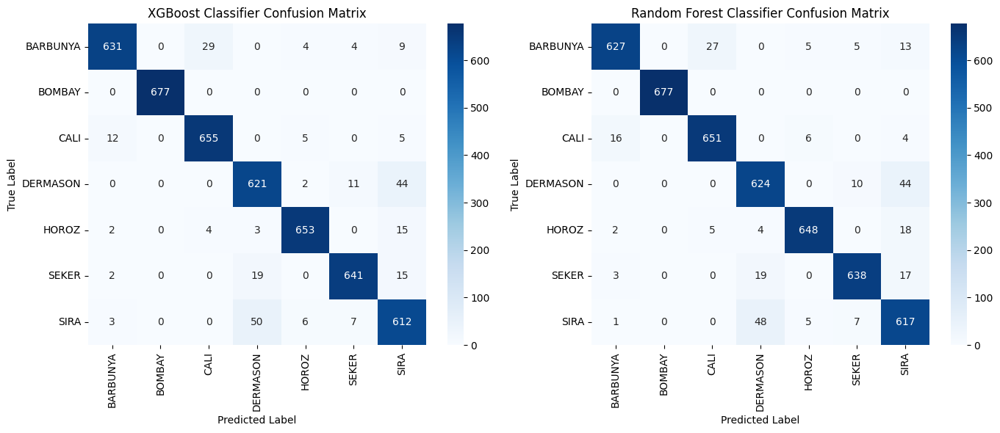

In [44]:
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

def plot_confusion_matrix(model, X_test, y_test, title, ax, labels):
    y_pred = model.predict(X_test)
    cm = confusion_matrix(y_test, y_pred)
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', ax=ax,
                xticklabels=labels, yticklabels=labels)
    ax.set_title(title)
    ax.set_xlabel('Predicted Label')
    ax.set_ylabel('True Label')

# Get the class labels
class_labels = label_encoder.classes_

# Create a figure with subplots for the top performing models
# Using a smaller figsize to fit within typical display limits
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot Confusion Matrix for XGBoost (using the untuned model)
plot_confusion_matrix(xgb_model, X_test, y_test, 'XGBoost Classifier Confusion Matrix', axes[0], class_labels)

# Plot Confusion Matrix for Random Forest (using the untuned model)
plot_confusion_matrix(rf_model, X_test, y_test, 'Random Forest Classifier Confusion Matrix', axes[1], class_labels)

plt.tight_layout()
plt.show()

## 8. Hyperparameter Tuning for Top Models (XGBoost)

In [45]:
from sklearn.model_selection import GridSearchCV
from xgboost import XGBClassifier
from sklearn.metrics import classification_report, accuracy_score
import time

print("### Hyperparameter Tuning for XGBoost Classifier (GridSearchCV) ###")

# Define a focused parameter grid to reduce overfitting
param_grid_xgb = {
    'n_estimators': [100, 200],
    'learning_rate': [0.05, 0.1],
    'max_depth': [3, 5, 7],
    'subsample': [0.8],
    'colsample_bytree': [0.8]
}

# Initialize XGBoost
xgb_base = XGBClassifier(objective='multi:softmax', num_class=len(label_encoder.classes_), random_state=42, eval_metric='mlogloss')

# Initialize GridSearchCV
grid_search_xgb = GridSearchCV(estimator=xgb_base, param_grid=param_grid_xgb, scoring='accuracy', cv=3, verbose=1, n_jobs=-1)

print("Starting GridSearchCV for XGBoost...")
start_time = time.time()
grid_search_xgb.fit(X_train, y_train)
end_time = time.time()

print(f"\nBest Parameters for XGBoost: {grid_search_xgb.best_params_}")

# Evaluate the best model
best_xgb = grid_search_xgb.best_estimator_
y_pred_xgb_tuned = best_xgb.predict(X_test)
print(f"Tuned Test Accuracy: {accuracy_score(y_test, y_pred_xgb_tuned):.4f}")

### Hyperparameter Tuning for XGBoost Classifier (GridSearchCV) ###
Starting GridSearchCV for XGBoost...
Fitting 3 folds for each of 12 candidates, totalling 36 fits

Best Parameters for XGBoost: {'colsample_bytree': 0.8, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 200, 'subsample': 0.8}
Tuned Test Accuracy: 0.9494


### Hyperparameter Tuning for Random Forest Classifier (using GridSearchCV)

In [46]:
from sklearn.model_selection import RandomizedSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, accuracy_score
import time

print("### Hyperparameter Tuning for Random Forest (RandomizedSearchCV) ###")

# Define the parameter distribution to sample from
param_dist_rf = {
    'n_estimators': [100, 200, 300, 400],
    'max_depth': [10, 15, 20, 25, None],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['sqrt', 'log2'],
    'bootstrap': [True, False]
}

# Initialize the base Random Forest model
rf_base = RandomForestClassifier(random_state=42, class_weight='balanced')

# Initialize RandomizedSearchCV
# n_iter determines the number of random combinations to try
random_search_rf = RandomizedSearchCV(
    estimator=rf_base,
    param_distributions=param_dist_rf,
    n_iter=20,
    scoring='accuracy',
    cv=3,
    verbose=1,
    random_state=42,
    n_jobs=-1
)

print("Starting Randomized Search...")
start_time = time.time()
random_search_rf.fit(X_train, y_train)
end_time = time.time()

print(f"\nSearch completed in {end_time - start_time:.2f} seconds.")
print("Best Parameters found:", random_search_rf.best_params_)

# Evaluate the best model
best_rf_tuned = random_search_rf.best_estimator_
y_pred_rf_tuned = best_rf_tuned.predict(X_test)

print("\n### Tuned Random Forest Evaluation ###")
test_acc = accuracy_score(y_test, y_pred_rf_tuned)
train_acc = accuracy_score(y_train, best_rf_tuned.predict(X_train))

print(f"Train Accuracy: {train_acc:.4f}")
print(f"Test Accuracy: {test_acc:.4f}")
print(f"Generalization Gap: {train_acc - test_acc:.4f}")

print("\nClassification Report:")
print(classification_report(y_test, y_pred_rf_tuned, target_names=label_encoder.classes_))

### Hyperparameter Tuning for Random Forest (RandomizedSearchCV) ###
Starting Randomized Search...
Fitting 3 folds for each of 20 candidates, totalling 60 fits

Search completed in 772.24 seconds.
Best Parameters found: {'n_estimators': 300, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': None, 'bootstrap': True}

### Tuned Random Forest Evaluation ###
Train Accuracy: 1.0000
Test Accuracy: 0.9468
Generalization Gap: 0.0532

Classification Report:
              precision    recall  f1-score   support

    BARBUNYA       0.97      0.93      0.95       677
      BOMBAY       1.00      1.00      1.00       677
        CALI       0.95      0.96      0.96       677
    DERMASON       0.90      0.93      0.91       678
       HOROZ       0.98      0.96      0.97       677
       SEKER       0.97      0.95      0.96       677
        SIRA       0.87      0.91      0.89       678

    accuracy                           0.95      4741
   macro avg       0.95  

9. Model Comparison Table
Model	Train Accuracy	Test Accuracy	F1 Score  	Overfitting (Y/N)
Logistic Regression
Decision Tree
Random Forest
SVM
KNN
and other algos..
Best Model
________________________________________


In [47]:
import pandas as pd
from sklearn.metrics import f1_score, accuracy_score

# Helper function to calculate metrics
def get_metrics(model, name):
    y_pred_test = model.predict(X_test)
    y_pred_train = model.predict(X_train)

    test_acc = accuracy_score(y_test, y_pred_test)
    train_acc = accuracy_score(y_train, y_pred_train)
    f1 = f1_score(y_test, y_pred_test, average='weighted')

    diff = train_acc - test_acc
    overfitting = "Yes" if diff > 0.02 else "No"

    return {
        'Model': name,
        'Train Accuracy': train_acc,
        'Test Accuracy': test_acc,
        'F1 Score': f1,
        'Overfitting (Y/N)': overfitting
    }

# Collect data for all models
comparison_data = [
    get_metrics(log_reg_model, 'Logistic Regression'),
    get_metrics(dt_model, 'Decision Tree'),
    get_metrics(knn_model, 'KNN'),
    get_metrics(svm_model, 'SVM'),
    get_metrics(rf_model, 'Random Forest (Base)'),
    get_metrics(best_rf_tuned, 'Random Forest (Tuned)'),
    get_metrics(xgb_model, 'XGBoost (Base)'),
    get_metrics(best_xgb, 'XGBoost (Tuned)')
]

# Create DataFrame
comparison_df = pd.DataFrame(comparison_data)

# Find the best model based on F1 Score
best_model_idx = comparison_df['F1 Score'].idxmax()
best_model_name = comparison_df.loc[best_model_idx, 'Model']

print("### 9. Model Comparison Table")
display(comparison_df.style.format({
    'Train Accuracy': '{:.4f}',
    'Test Accuracy': '{:.4f}',
    'F1 Score': '{:.4f}'
}).highlight_max(subset=['F1 Score'], color='lightgreen'))

print(f"\n**Best Model:** {best_model_name}")

### 9. Model Comparison Table


,Model,Train Accuracy,Test Accuracy,F1 Score,Overfitting (Y/N)
0,Logistic Regression,0.9260,0.9272,0.9272,No
1,Decision Tree,1.0000,0.9226,0.9228,Yes
2,KNN,0.9621,0.9380,0.9382,Yes
3,SVM,0.9353,0.9308,0.9311,No
4,Random Forest (Base),1.0000,0.9454,0.9457,Yes
5,Random Forest (Tuned),1.0000,0.9468,0.9471,Yes
6,XGBoost (Base),0.9984,0.9471,0.9473,Yes
7,XGBoost (Tuned),0.9992,0.9494,0.9496,Yes



**Best Model:** XGBoost (Tuned)


## saved the file as pkl file

In [49]:
import pickle
import pandas as pd
import numpy as np
from xgboost import XGBClassifier
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, RobustScaler
from scipy.stats import yeojohnson
from imblearn.over_sampling import SMOTE

# 1. Load data
df_raw = pd.read_excel('dry Beans Multiclass Classification (1).xlsx')

# 2. Preprocessing: Yeo-Johnson & Cleaning
numerical_features = df_raw.select_dtypes(include=np.number).columns.tolist()
for feature in numerical_features:
    df_raw[feature], _ = yeojohnson(df_raw[feature])

# IQR Outlier Removal
df_c = df_raw.copy()
for col in numerical_features:
    Q1, Q3 = df_c[col].quantile(0.25), df_c[col].quantile(0.75)
    IQR = Q3 - Q1
    df_c = df_c[(df_c[col] >= Q1 - 1.5 * IQR) & (df_c[col] <= Q3 + 1.5 * IQR)]

df_c = df_c.drop(columns=['Solidity', 'ShapeFactor4'])

# 3. Scaling and Encoding
X_raw = df_c.drop('Class', axis=1)
y_raw = df_c['Class']
scaler = RobustScaler()
X_scaled = scaler.fit_transform(X_raw)
le = LabelEncoder()
y_encoded = le.fit_transform(y_raw)

# 4. SMOTE & Split
smote = SMOTE(random_state=42)
X_res, y_res = smote.fit_resample(X_scaled, y_encoded)
X_train, X_test, y_train, y_test = train_test_split(X_res, y_res, test_size=0.2, random_state=42, stratify=y_res)

# 5. Train Best Model (XGBoost)
best_xgb = XGBClassifier(
    objective='multi:softmax',
    num_class=7,
    colsample_bytree=0.8,
    learning_rate=0.1,
    max_depth=7,
    n_estimators=200,
    subsample=0.8,
    random_state=42,
    eval_metric='mlogloss'
)
best_xgb.fit(X_train, y_train)

# 6. Save
model_filename = 'best_bean_classifier_xgb.pkl'
with open(model_filename, 'wb') as file:
    pickle.dump(best_xgb, file)

print(f"Successfully saved the best model to {model_filename}")

Successfully saved the best model to best_bean_classifier_xgb.pkl


## 10.  Build a Simple Classifier App
•	Use Streamlit to create a basic UI

•	Input physical measurements of a bean and get predicted class


## export clean data

### 10. Build a Simple Classifier App with Streamlit

This cell will create a `app.py` file. This script loads the `.pkl` model and creates a user interface for manual input.